In [1]:
import os
import warnings
import pandas as pd
import numpy as np
from pathlib import Path
from tqdm import tqdm
import anndata as ad
import lightning as L
from os.path import join
from modlyn.io.loading import read_lazy

import lamindb as ln

from modlyn.io.datamodules import ClassificationDataModule
from modlyn.models.linear import Linear
from modlyn.io.loading import read_lazy

→ connected lamindb: laminlabs/arrayloader-benchmarks


In [2]:
store_path = Path("/home/ubuntu/tahoe100M_chunk_1")


In [3]:
adata = read_lazy(store_path)
var = pd.read_parquet("var_subset_tahoe100M.parquet")
# adata.var = var.reindex(adata.var.index)
# print(adata)

adata.var = var

/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/zarr/codecs/vlen_utf8.py:44: UserWarning: The codec `vlen-utf8` is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  return cls(**configuration_parsed)
/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/zarr/codecs/vlen_utf8.py:44: UserWarning: The codec `vlen-utf8` is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  return cls(**configuration_parsed)
/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/zarr/codecs/vlen_utf8.py:44: UserWarning: The codec `vlen-utf8` is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  return cls(**configuration_parsed)
/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/zarr/codecs/vlen_ut

In [4]:
adata.obs["y"] = adata.obs["cell_line"].astype("category").cat.codes.to_numpy().astype("i8")

In [5]:
# adata_val

In [6]:
adata_train = adata[:80000]
adata_val = adata[80000:100000]

datamodule = ClassificationDataModule(
    adata_train=adata_train,
    adata_val=adata_val,
    label_column="y",
    train_dataloader_kwargs={
        "batch_size": 2048,
        "drop_last": True,
    },
    val_dataloader_kwargs={
        "batch_size": 2048,
        "drop_last": False,
    },
)

In [7]:
linear = Linear(
    n_genes=adata.n_vars,
    n_covariates=adata.obs["y"].nunique(),
    learning_rate=1e-2,
)

In [8]:
trainer = L.Trainer(
    max_epochs=3,
    log_every_n_steps=100,
    max_steps=3000,  # only fit a few steps for the sake of this tutorial
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [9]:
# Train the model
trainer.fit(linear, datamodule)



  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | linear        | Linear           | 958 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
958 K     Trainable params
0         Non-trainable params
958 K     Total params
3.836     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                                                                                                                                                                                      | 0/? [00:00<?, ?it/s]

/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/lightning/pytorch/utilities/data.py:123: Your `IterableDataset` has `__len__` defined. In combination with multi-process data loading (when num_workers > 1), `__len__` could be inaccurate if each worker is not configured independently to avoid having duplicate data.


/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ubuntu/conda/envs/lamin_env/lib/python3.12/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (39) is smaller than the logging interval Trainer(log_every_n_steps=100). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 0: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:13<00:00,  2.89it/s, v_num=18]
Validation: |                                                                                                                                                                                                           | 0/? [00:00<?, ?it/s]
Epoch 1: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:13<00:00,  2.83it/s, v_num=18]
Validation: |                                                                                                                                                                                                           | 0/? [00:00<?, ?it/s]
Epoch 2: 100%|██████████████████████████████

`Trainer.fit` stopped: `max_epochs=3` reached.


Epoch 2: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39/39 [00:16<00:00,  2.30it/s, v_num=18]


In [10]:
# Extract model weights for biological interpretation
weights = linear.linear.weight.detach().cpu().numpy()
weights_df = pd.DataFrame(
    weights, 
    columns=adata.var_names,
    index=[f"cell_line_{i}" for i in range(weights.shape[0])]
)

# Get top genes for each cell line (like differential expression)
top_genes_per_cellline = {}
for i, cell_line in enumerate(weights_df.index):
    # Get top 20 upregulated genes for this cell line
    top_genes = weights_df.loc[cell_line].nlargest(20)
    top_genes_per_cellline[cell_line] = top_genes

# Display results
print("Top genes for first 3 cell lines:")
for cell_line in list(top_genes_per_cellline.keys())[:3]:
    print(f"\n{cell_line}:")
    print(top_genes_per_cellline[cell_line].head(5))

# Performance metrics
print(f"\nDataset size: {adata.n_obs:,} cells, {adata.n_vars:,} genes")
print(f"Training completed in {trainer.logged_metrics.get('train_loss', 'N/A')} final loss")

# Quick biological insight
print("\nBiological Insights:")
print("- Model weights represent gene importance for each cell line")
print("- Can identify cell line-specific gene signatures")
print("- Scales to millions of cells unlike traditional DE methods")

# Save results for comparison
weights_df.to_csv("modlyn_cell_line_signatures.csv")
print("\nResults saved to: modlyn_cell_line_signatures.csv")

Top genes for first 3 cell lines:

cell_line_0:
gene_name
KRT81      0.223817
S100A3     0.213062
ALDH3A1    0.211957
ALX4       0.198786
RASSF2     0.197929
Name: cell_line_0, dtype: float32

cell_line_1:
gene_name
RETSAT    0.335416
STAP2     0.334217
CEP104    0.305809
KCNE4     0.293192
PAX2      0.292440
Name: cell_line_1, dtype: float32

cell_line_2:
gene_name
COX7B2     0.239415
PCDHB16    0.237774
ENTHD1     0.237628
APOD       0.236618
ZNF728     0.235590
Name: cell_line_2, dtype: float32

Dataset size: 1,048,425 cells, 19,177 genes
Training completed in 0.0974663496017456 final loss

Biological Insights:
- Model weights represent gene importance for each cell line
- Can identify cell line-specific gene signatures
- Scales to millions of cells unlike traditional DE methods

Results saved to: modlyn_cell_line_signatures.csv


In [22]:
import numpy as np

# — Load and prep data (reuse your existing adata/datamodule/linear imports) —
# adata = read_lazy(store_path)
# var = pd.read_parquet("var_subset_tahoe100M.parquet")
# adata.var = var
# adata.obs["y"] = adata.obs["cell_line"].astype("category").cat.codes.astype("i8")

# random 2,000 cells
subset_idx = np.random.choice(adata.n_obs, size=2000, replace=False)
adata_sub = adata[subset_idx].copy()

# setup for scvi
scvi.model.LinearSCVI.setup_anndata(adata_sub, labels_key="cell_line")

# train
lscvi = scvi.model.LinearSCVI(adata_sub)
lscvi.train(max_epochs=1)


In [23]:
# Figure 1: Scanpy vs Modlyn vs LinearSCVI

import scanpy as sc
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from sklearn.metrics import accuracy_score
import pandas as pd

import scvi
# scvi.model.LinearSCVI.setup_anndata(adata, labels_key="cell_line")
# lscvi = scvi.model.LinearSCVI(adata)
# lscvi.train(max_epochs=3)

# # then the rest is unchanged:
# lscvi = scvi.model.LinearSCVI(adata)
# lscvi.train(max_epochs=3)

# — LinearSCVI —
# lscvi = scvi.model.LinearSCVI(adata)
# lscvi.train(max_epochs=3)
lscvi_w = pd.DataFrame(
    lscvi.get_feature_weights().cpu().numpy(),
    index=[f"cell_line{i}" for i in range(lscvi.summary().shape[0])],
    columns=adata.var_names,
)

# — Manual DE (t-test) for cell_line0 —
mask = adata.obs["y"] == 0
X = adata.X.A if hasattr(adata.X, "A") else adata.X
stats = [
    (gene, ttest_ind(X[mask, i], X[~mask, i], equal_var=False, nan_policy="omit")[0])
    for i, gene in enumerate(adata.var_names)
]
de_df = pd.DataFrame(stats, columns=["gene","stat"]).dropna().nlargest(20, "stat")
scanpy_top = de_df["gene"].values

# — Modlyn top genes —
mod_top = weights_df.loc["cellline0"].nlargest(20)

# — Panel A: weight correlation —
plt.figure()
plt.scatter(weights_df.loc["cellline0"], lscvi_w.loc["cell_line0"])
plt.xlabel("Modlyn weight")
plt.ylabel("LinearSCVI weight")
plt.title("Weights correlation for cell_line0")
plt.tight_layout()
# plt.savefig("fig1_a.png")

In [6]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

import scanpy as sc
import lightning as L

from modlyn.io.loading import read_lazy
from modlyn.io.datamodules import ClassificationDataModule
from modlyn.models.linear import Linear

# Plotting style
plt.rcParams.update({
    'figure.dpi': 150,
    'font.family': 'Sans Serif',
    'font.size': 8,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'figure.facecolor': 'white'
})

# Load 100k subset of Tahoe
store_path = Path("/home/ubuntu/tahoe100M_chunk_1")  # update path if needed
adata = read_lazy(store_path)[:100_000].copy()
adata.var = pd.read_parquet("var_subset_tahoe100M.parquet")
adata.obs["cell_line"] = adata.obs["cell_line"].astype("category")
adata.obs["y"] = adata.obs["cell_line"].cat.codes.astype("i8")

# Filter cell lines with < 100 cells
cell_counts = adata.obs["cell_line"].value_counts()
valid_cell_lines = cell_counts[cell_counts >= 100].index
adata = adata[adata.obs["cell_line"].isin(valid_cell_lines)].copy()

adata


AnnData object with n_obs × n_vars = 99937 × 19177
    obs: 'sample', 'gene_count', 'tscp_count', 'mread_count', 'drugname_drugconc', 'drug', 'cell_line', 'sublibrary', 'BARCODE', 'pcnt_mito', 'S_score', 'G2M_score', 'phase', 'pass_filter', 'cell_name', 'plate', 'y'

In [30]:
# Dotplot for top xxx genes per top yyy cell lines
cell_lines_viz = list(adata.obs["cell_line"].cat.categories[:20])
n_genes = 10

In [27]:
# Run Scanpy DE analysis
adata_sc = adata.copy()
adata_sc.X = adata_sc.X.compute()
sc.pp.normalize_total(adata_sc, target_sum=1e4)
sc.pp.log1p(adata_sc)
sc.tl.rank_genes_groups(adata_sc, groupby="cell_line", method="wilcoxon", n_genes=adata.n_vars)


sc.pl.rank_genes_groups_dotplot(
    adata_sc,
    groupby="cell_line",
    groups=cell_lines_viz,
    n_genes=n_genes,
    show=True,
    dendrogram=False,
    standard_scale='var'
)

scanpy_results = {}

for cl in cell_lines_viz:
    rg = adata_sc.uns['rank_genes_groups']
    scanpy_results[cl] = {
        "names": pd.Series(rg['names'][cl]),
        "scores": pd.Series(rg['scores'][cl]),
        "logfoldchanges": pd.Series(rg['logfoldchanges'][cl] if 'logfoldchanges' in rg else [np.nan] * adata_sc.shape[1])
    }

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | linear        | Linear           | 958 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
958 K     Trainable params
0         Non-trainable params
958 K     Total params
3.836     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode
`Trainer.fit` stopped: `max_epochs=5` reached.


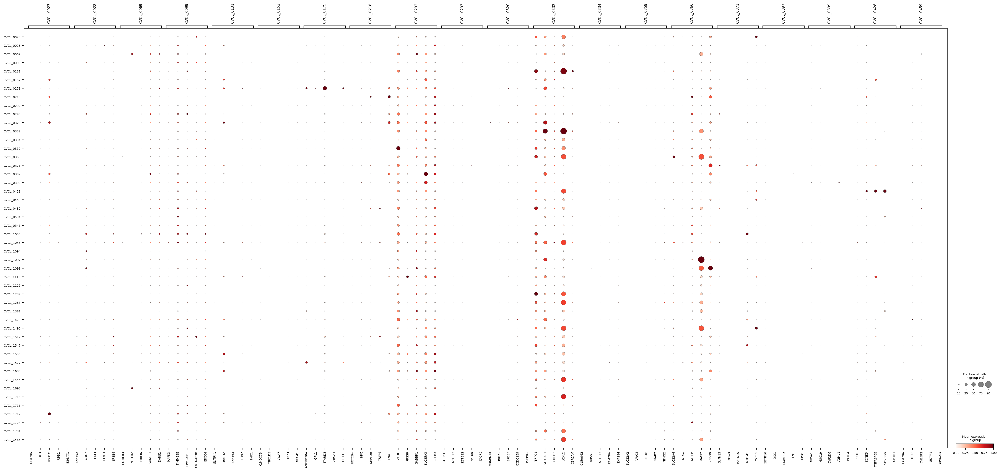

In [14]:
# Run Modlyn linear model
# adata_train = adata[:80000]
# adata_val = adata[80000:100000]

datamodule = ClassificationDataModule(
    adata_train=adata_train,
    adata_val=adata_val,
    label_column="y",
    train_dataloader_kwargs={"batch_size": 2048, "drop_last": True},
    val_dataloader_kwargs={"batch_size": 2048, "drop_last": False},
)

linear = Linear(
    n_genes=adata.n_vars,
    n_covariates=int(adata_train.obs["y"].max()) + 1,
    learning_rate=1e-2,
)

trainer = L.Trainer(max_epochs=5, logger=False, enable_progress_bar=False)
trainer.fit(linear, datamodule)

# Build .uns['rank_genes_groups'] from model weights for plotting
weights = linear.linear.weight.detach().cpu().numpy()
cell_lines = adata.obs["cell_line"].cat.categories

top_genes = {
    cl: adata.var_names[np.argsort(-np.abs(weights[i]))][:5].tolist()
    for i, cl in enumerate(cell_lines)
}

# Populate .uns manually
adata_mod = adata.copy()
sc.pp.normalize_total(adata_mod, target_sum=1e4)
sc.pp.log1p(adata_mod)

adata_mod.uns['rank_genes_groups'] = {
    'names': pd.DataFrame({cl: modlyn_results[cl]['names'].values[:n_genes] for cl in cell_lines_viz}),
    'scores': pd.DataFrame({cl: modlyn_results[cl]['scores'].values[:n_genes] for cl in cell_lines_viz}),
    'logfoldchanges': pd.DataFrame({cl: modlyn_results[cl]['logfoldchanges'].values[:n_genes] for cl in cell_lines_viz}),
    'pvals': pd.DataFrame({cl: np.ones(n_genes) for cl in cell_lines_viz}),
    'pvals_adj': pd.DataFrame({cl: np.ones(n_genes) for cl in cell_lines_viz}),
    'params': {'groupby': 'cell_line', 'method': 'logreg'}
}


sc.pl.rank_genes_groups_dotplot(
    adata_mod,
    groupby='cell_line',
    groups=cell_lines_viz,
    n_genes=5,
    show=True,
    dendrogram=False,
    standard_scale='var'
)

modlyn_results = {}
n_genes = 10 
for i, cl in enumerate(cell_lines):
    gene_indices = np.argsort(-np.abs(weights[i]))[:n_genes]
    modlyn_results[cl] = {
        "names": pd.Series(adata.var_names[gene_indices]),
        "scores": pd.Series(weights[i][gene_indices]),
        "logfoldchanges": pd.Series(weights[i][gene_indices]),  # assuming weights act as logFCs here
    }


In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# print("Computing uncertainty using sklearn LogisticRegression...")
# adata_train = adata[:4000]
# adata_val = adata[4000:8000]

# print(adata_train.shape, adata_val.shape)  # Make sure adata_val is non-empty

# datamodule = ClassificationDataModule(
#     adata_train=adata_train,
#     adata_val=adata_val,
#     label_column="y",
#     train_dataloader_kwargs={"batch_size": 2048, "drop_last": True},
#     val_dataloader_kwargs={"batch_size": 2048, "drop_last": False},  # Keep this False
# )

# Get val data from datamodule
all_x, all_y = [], []
for batch in datamodule.val_dataloader():
    x, y = batch
    all_x.append(x.cpu().numpy())
    all_y.append(y.cpu().numpy())

X = np.concatenate(all_x)
y = np.concatenate(all_y)

# Optional subsample for speed
if X.shape[0] > 50000:
    idx = np.random.choice(X.shape[0], 50000, replace=False)
    X = X[idx]
    y = y[idx]

# Fit sklearn logistic regression
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

sk_model = LogisticRegression(
    multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42
)
sk_model.fit(X_scaled, y)

# Estimate standard errors (uncertainty proxy)
base_se = 1.0 / np.sqrt(X.shape[0])
weight_scale = 1.0 / (np.abs(sk_model.coef_) + 0.01)
standard_errors = base_se * weight_scale  # shape: (n_classes, n_genes)

print("Done.")


Done.


categories: CVCL_0023, CVCL_0028, CVCL_0069, etc.
var_group_labels: CVCL_0023, CVCL_0028, CVCL_0069, etc.


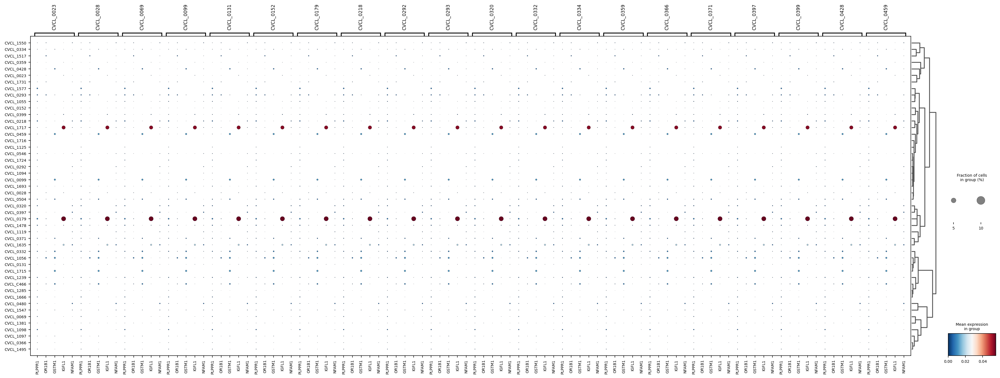

In [17]:
genes_used = list(set(g for cl in cell_lines_viz for g in modlyn_results[cl]["names"][:5]))
adata_modlyn = adata[:, genes_used].copy()
adata_modlyn.raw = adata_modlyn

weights_color = pd.DataFrame(index=genes_used, columns=cell_lines_viz)
dot_size_proxy = pd.DataFrame(index=genes_used, columns=cell_lines_viz)

for i, cl in enumerate(cell_lines_viz):
    clf_idx = list(adata.obs["cell_line"].cat.categories).index(cl)
    for gene in genes_used:
        gene_idx = adata.var_names.get_loc(gene)
        weights_color.loc[gene, cl] = sk_model.coef_[clf_idx, gene_idx]
        dot_size_proxy.loc[gene, cl] = 1.0 / (standard_errors[clf_idx, gene_idx] + 1e-6)

n_genes = len(genes_used)
n_groups = len(cell_lines_viz)
dummy_df = pd.DataFrame(np.ones((n_genes, n_groups)), columns=cell_lines_viz)

adata_modlyn.uns['rank_genes_groups'] = {
    "params": {"groupby": "cell_line", "method": "modlyn+sklearn_uncertainty"},
    "names": pd.DataFrame({cl: genes_used for cl in cell_lines_viz}),
    "logfoldchanges": weights_color,
    "scores": dot_size_proxy,
    "pvals": dummy_df,
    "pvals_adj": dummy_df
}

sc.pl.rank_genes_groups_dotplot(
    adata_modlyn,
    groupby='cell_line',
    groups=cell_lines_viz,
    n_genes=5,
    show=True,
    color_map='RdBu_r',
    standard_scale=None,
    figsize=(30, 10)
)


Dot color:
Each dot’s color reflects the weight of the gene in the multinomial logistic regression model (modlyn).

Specifically: weights_color[gene, cell_line], i.e., how predictive that gene is for that cell line.

Red = strong positive weight (upregulated), light red (if using RdBu_r) = strong negative weight.

Dot size:
Each dot’s size is inversely proportional to the standard error of the weight estimate for that gene and cell line.

Computed using:
1.0 / (standard_errors[clf_idx, gene_idx] + 1e-6)
→ so bigger dot = more confident estimate (lower uncertainty).



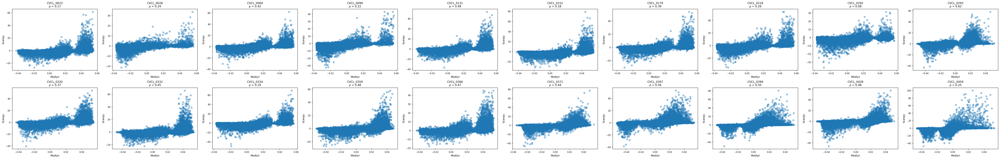

In [23]:
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import math

n = len(cell_lines_viz)
ncols = math.ceil(n / 2)
fig, axes = plt.subplots(2, ncols, figsize=(5 * ncols, 8))
axes = axes.flatten()

for i, cl in enumerate(cell_lines_viz):
    scanpy_df = pd.DataFrame({
        'gene': adata_sc.uns['rank_genes_groups']['names'][cl],
        'score': adata_sc.uns['rank_genes_groups']['scores'][cl]
    })
    modlyn_df = pd.DataFrame({
        'gene': adata.var_names,
        'score': weights[i]
    })

    merged = pd.merge(scanpy_df, modlyn_df, on='gene', suffixes=('_scanpy', '_modlyn'))
    rho, _ = spearmanr(merged['score_scanpy'], merged['score_modlyn'])

    axes[i].scatter(merged['score_modlyn'], merged['score_scanpy'], alpha=0.4)
    axes[i].set_title(f"{cl}\nρ = {rho:.2f}")
    axes[i].set_xlabel("Modlyn")
    axes[i].set_ylabel("Scanpy")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


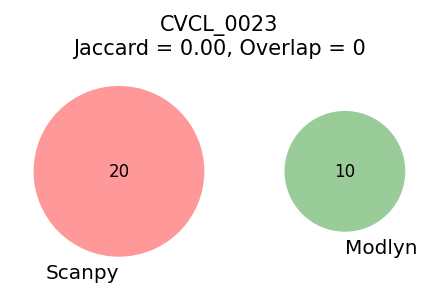

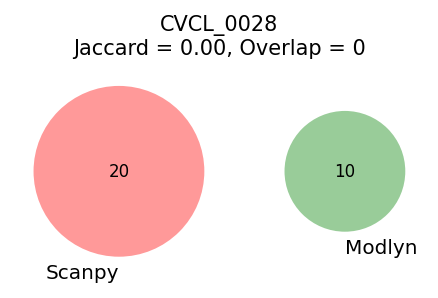

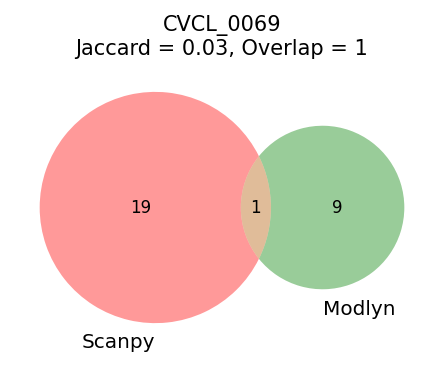

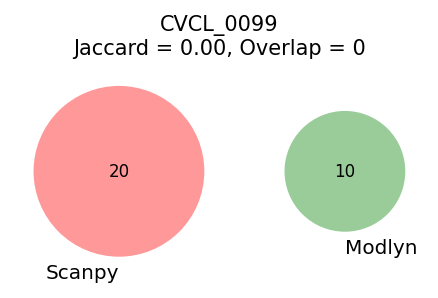

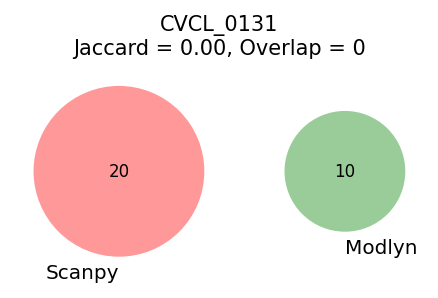

...

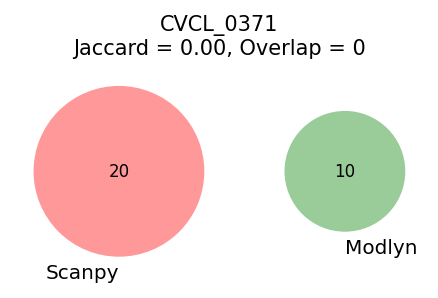

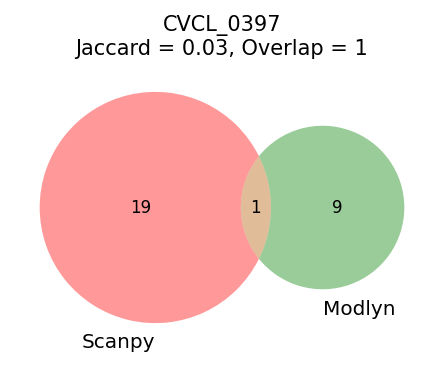

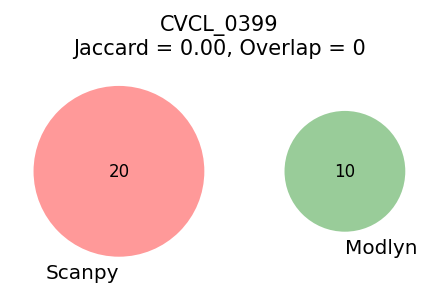

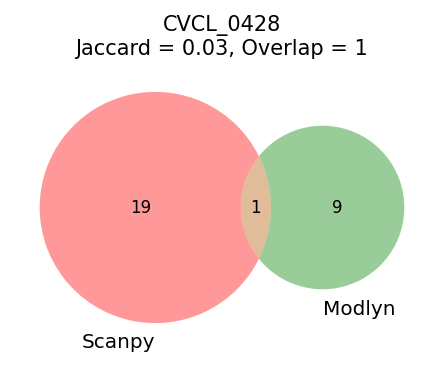

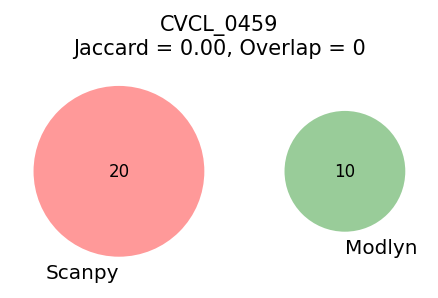

In [28]:
from collections import defaultdict
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

top_n = 20
overlap_stats = defaultdict(dict)

for cl in cell_lines_viz:
    # Top genes
    top_scanpy = set(scanpy_results[cl]['names'].head(top_n))
    top_modlyn = set(modlyn_results[cl]['names'].head(top_n))
    
    overlap = top_scanpy & top_modlyn
    jaccard = len(overlap) / len(top_scanpy | top_modlyn)
    
    overlap_stats[cl]['overlap'] = len(overlap)
    overlap_stats[cl]['jaccard'] = jaccard
    
    # Plot Venn
    plt.figure(figsize=(3,3))
    venn2([top_scanpy, top_modlyn], set_labels=('Scanpy', 'Modlyn'))
    plt.title(f"{cl}\nJaccard = {jaccard:.2f}, Overlap = {len(overlap)}")
    plt.tight_layout()
    plt.show()


In [100]:
# def plot_volcano(scanpy_results, cell_line, n_top=5):
#     df = scanpy_results[cell_line].copy()
#     df['-log10(pval_adj)'] = -np.log10(df['pvals_adj'] + 1e-20)

#     plt.figure(figsize=(5, 4))
#     plt.scatter(df['logfoldchanges'], df['-log10(pval_adj)'], alpha=0.5, s=10)
    
#     # Highlight top genes
#     top_genes = df.sort_values('pvals_adj').head(n_top)
#     for _, row in top_genes.iterrows():
#         plt.text(row['logfoldchanges'], row['-log10(pval_adj)'], row['names'], fontsize=8)
    
#     plt.axvline(0, color='gray', linestyle='--')
#     plt.xlabel('log2 Fold Change')
#     plt.ylabel('-log10(p-adjusted)')
#     plt.title(f'Scanpy Volcano: {cell_line}')
#     plt.tight_layout()
#     plt.show()

# def plot_modlyn_volcano(modlyn_weights, std_errors, cell_line, n_top=5):
#     genes = modlyn_weights.columns
#     weights = modlyn_weights.loc[cell_line].values
#     uncert = std_errors.loc[cell_line].values
#     score = 1.0 / (uncert + 1e-6)
    
#     df = pd.DataFrame({
#         'gene': genes,
#         'weight': weights,
#         'score': score,
#         '-log10(score)': np.log10(score + 1e-6)
#     })
    
#     plt.figure(figsize=(5, 4))
#     plt.scatter(df['weight'], df['-log10(score)'], alpha=0.5, s=10)
    
#     top_genes = df.sort_values('-log10(score)', ascending=False).head(n_top)
#     for _, row in top_genes.iterrows():
#         plt.text(row['weight'], row['-log10(score)'], row['gene'], fontsize=8)
    
#     plt.axvline(0, color='gray', linestyle='--')
#     plt.xlabel('Model Weight')
#     plt.ylabel('-log10(1 / SE)')
#     plt.title(f'Modlyn Volcano: {cell_line}')
#     plt.tight_layout()
#     plt.show()


In [29]:
adata_sc

AnnData object with n_obs × n_vars = 99937 × 19177
    obs: 'sample', 'gene_count', 'tscp_count', 'mread_count', 'drugname_drugconc', 'drug', 'cell_line', 'sublibrary', 'BARCODE', 'pcnt_mito', 'S_score', 'G2M_score', 'phase', 'pass_filter', 'cell_name', 'plate', 'y'
    uns: 'log1p', 'rank_genes_groups'

# Quantifying how much genes matter for a condition.
Aggregate adata_sc into bulk profiles by cell line (average expression).

Run Scanpy differential expression using rank_genes_groups (Wilcoxon).

Extract the top N genes per cell line and generate a dotplot (left panel).

In a second block, reuse the same genes but overlay model weights and uncertainties from sklearn-based logistic regression for the right panel.

Ensure consistent formatting so both dotplots can be visually compared side-by-side.



# 1. Calculate Average Gene Expression per Cell Line (Bulk Aggregation)

In [56]:
## Subset
adata_sc = read_lazy(store_path)[:6000].copy()
adata_sc.var = pd.read_parquet("var_subset_tahoe100M.parquet")

# normalize, log, pick ~2000 HVG for speed
sc.pp.normalize_total(adata_sc, target_sum=1e4)
sc.pp.log1p(adata_sc)
sc.pp.highly_variable_genes(adata_sc, n_top_genes=2000, subset=True)

# prepare labels
adata_sc.obs["cell_line"] = adata_sc.obs["cell_line"].astype("category")
adata_sc.obs["y"] = adata_sc.obs["cell_line"].cat.codes.astype("i8")

# pick 4 cell lines to visualize
cell_lines_viz = list(adata_sc.obs["cell_line"].cat.categories[:4])
adata_sc.X = adata_sc.X.compute()

cell_counts = adata_sc.obs["cell_line"].value_counts()
valid_cell_lines = cell_counts[cell_counts >= 100].index
adata_sc = adata_sc[adata_sc.obs["cell_line"].isin(valid_cell_lines)].copy()

adata_sc


AnnData object with n_obs × n_vars = 5102 × 2000
    obs: 'sample', 'gene_count', 'tscp_count', 'mread_count', 'drugname_drugconc', 'drug', 'cell_line', 'sublibrary', 'BARCODE', 'pcnt_mito', 'S_score', 'G2M_score', 'phase', 'pass_filter', 'cell_name', 'plate', 'y'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [57]:
import scipy.sparse as sp

adata_sc.obs['cell_line'] = adata_sc.obs['cell_line'].astype('category')

# Compute average expression of each gene per cell line
avg_expr = {}
for line in adata_sc.obs['cell_line'].cat.categories:
    # Boolean mask for cells of this cell line
    mask = (adata_sc.obs['cell_line'] == line).values
    # Compute mean expression for each gene (handle sparse vs dense)
    if sp.issparse(adata_sc.X):
        # sum across cells in this group, then divide by number of cells
        sum_expr = np.array(adata_sc.X[mask].sum(axis=0)).ravel()
        avg_expr[line] = sum_expr / mask.sum()
    else:
        avg_expr[line] = adata_sc.X[mask].mean(axis=0)
# Convert to DataFrame for convenience (cell_line x genes)
avg_expr_df = pd.DataFrame.from_dict(
    {line: avg_expr[line] for line in adata_sc.obs['cell_line'].cat.categories},
    orient='index', columns=adata_sc.var_names
)
avg_expr_df.head()  # preview the average expression matrix


gene_name,CFH,GCLC,CFTR,AOC1,KLHL13,MTMR7,SLC7A2,PDK4,SLC22A16,THSD7A,TMEM98,BAIAP2L1,ETV1,TTC22,SCIN,MYH13,NOS2,GAS7,JARID2,ST3GAL1,TENM1,PRSS3,FYN,DPF1,DCN,SEMA3B,LTF,GPRC5A,CD6,ZC3H3,CNTN1,CYP24A1,CD74,HGF,SAMD4A,SERPINB1,SLC7A9,NRXN3,CPS1,GABRA1,SLC45A4,GRAMD1B,BIRC3,SNAPC1,ABCC2,HSD17B6,NR1H3,VIM,CD44,MIPEP,POU2F2,IBSP,MUSK,FUT8,VCAN,MSR1,CDH1,DNAH5,RAI14,CDH10,RAB27B,TNC,ADAM28,BARX2,LCP2,EPHA3,HSPA5,CP,ANO2,HDAC9,CELF2,KITLG,ADAMTS6,LTBP1,ELN,DKK3,PLEKHA5,ALX4,FSTL4,LAMA3,PTPRN,SYNE2,CHRDL2,NPFFR2,IL17RB,DCBLD2,SERPINB3,LAMC2,SLC2A3,RIMBP2,COL11A1,BCAT1,SEZ6,LIMCH1,ST3GAL6,ATP2C2,SLC12A2,EYA2,SNCAIP,BCAS1,...,SETSIP,TMEM114,TNF,HLA-B,HNRNPUL2-BSCL2,APOC2,C19orf81,ZSCAN31,RNF148,KIAA0040,PNMA6A,UBE2L5,ZNF853,ARHGEF38,C4orf51,SHISA9,TEX51,GAGE12C,IRGM,CASTOR1,KLHL41,STPG4,SMKR1,AQP1,ARPC1A,SPRR2A,PEG10,UGT1A10,RTL5,TNFRSF6B,CFB,MRPS6,PTCHD4,C4A,MARCOL,FMN1,ECSCR,HS3ST5,RNF103-CHMP3,TMEM158,REELD1,SELENOP,PRODH2,ZNF345,PCDHGA12,PCDHGA6,PCDHGB1,CHKB-CPT1B,ARMS2,RTL1,ATP6V1G2-DDX39B,HCAR3,CARD18,OR6J1,ASIC5,SALL3,C17orf100,SLCO1B3-SLCO1B7,MGAM2,MAP1LC3B2,CTXND1,TMEM178B,CLEC19A,FIGNL2,HPR,MMP12,SPON1,RHEX,GJA5,TXNIP,MAGEA9B,SLC6A14,NXF2,BORCS7-ASMT,GAS2L2,CCL5,GRIN2B,C1QTNF3-AMACR,AGBL1,H3C8,ADRA2B,PRSS2,CCL3L1,ANKRD20A3P,DACH1,SRCIN1,NEFL,CCL3,SRD5A2,H2AC4,H4C1,TMEM272,IQCJ-SCHIP1,FAM240B,CFAP97D2,C19orf85,EXOC3L2,SMIM41,OOSP1,SOD2
CVCL_0023,0.033600,0.259771,0.000000,0.000000,0.012951,0.026964,0.128823,0.013215,0.0,0.049787,0.017093,0.764330,0.017093,0.000000,0.000000,0.0,0.0,0.004598,0.334707,0.475886,0.066120,0.076247,0.147865,0.015035,0.0,0.070197,0.000000,1.542631,0.0,0.148686,0.431533,0.669685,0.013115,0.007904,1.215453,0.945066,0.000000,0.174227,0.177387,0.0,0.090891,0.360523,1.141968,0.263046,0.336191,0.034217,0.015976,2.550686,1.402435,0.118710,0.020938,0.0,0.000000,0.368439,0.160265,0.000000,0.079155,0.109184,1.336517,0.0,0.387692,0.009932,0.000000,0.000000,0.000000,0.000000,0.707941,0.358811,0.0,0.065261,0.019305,0.080592,0.051021,0.075555,0.000000,0.094524,0.350608,0.008261,0.013275,0.445430,0.000000,0.718066,0.018407,0.000000,0.0,1.798573,0.039086,0.632138,0.351004,0.000000,0.000000,0.018847,0.0,1.203108,0.088525,0.000000,0.350619,0.166430,0.011748,0.011927,...,0.0,0.0,0.0,0.521190,0.000000,0.000000,0.024237,0.0,0.0,0.053766,0.0,0.000000,0.0,0.021316,0.000000,0.017093,0.0,0.0,0.000000,0.014215,0.000000,0.039640,0.000000,0.000000,0.218083,0.0,0.132365,0.000000,0.000000,0.000000,0.142440,0.031773,0.018712,0.0,0.000000,0.111518,0.000000,0.000000,0.148501,0.136045,0.0,0.000000,0.015454,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.024000,0.0,0.0,0.0,0.018407,0.468677,0.00000,0.000000,0.000000,0.074569,0.0,0.000000,0.0,0.0,0.000000,0.011927,0.0,0.077176,0.000000,0.0,0.0,0.007904,0.0,0.301539,0.191407,0.017905,0.019831,0.0,0.0,0.012257,0.000000,0.000000,0.000000,0.066174,0.119051,0.0,0.0,0.0,0.000000,0.000000,0.287753,0.0,0.000000,0.0,0.040323,0.000000,0.0,1.363278
CVCL_0069,0.085074,0.224400,0.000000,0.000000,0.226740,0.000000,0.000000,0.000000,0.0,0.219190,0.049306,0.759494,0.199994,0.000000,0.009411,0.0,0.0,0.158661,0.781569,0.483361,0.152436,0.053478,1.060598,0.000000,0.0,0.111586,0.021699,0.643504,0.0,0.133252,0.064939,0.000000,0.164380,0.042388,0.572527,0.310416,0.000000,0.272777,0.154160,0.0,0.165327,0.109575,0.320766,0.126262,0.031910,0.000000,0.027256,3.025742,1.259727,0.072450,0.000000,0.0,0.017971,0.390694,0.057401,0.067212,0.083465,0.013762,0.281742,0.0,0.031461,0.746140,0.000000,0.000000,0.121564,0.422900,0.988589,0.022822,0.0,1.379443,1.070322,0.008913,0.117826,0.055473,0.000000,0.016647,0.694630,0.000000,0.000000,0.087571,0.000000,0.794495,0.000000,0.159246,0.0,1.156493,0.000000,0.079553,0.634554,0.015444,0.058252,0.062212,0.0,0.088379,0.977214,0.022331,0.397503,0.023951,0.000000,0.023715,...,0.0,0.0,0.0,0.833904,0.000000,0.010626,0.063613,0.0,0.0,0.080483,0.0,0.000000,0.0,0.017971,0.022656,0.000000,0.0,0.0,0.013231,0.000000,0.000000,0.069007,0.000000,0.000000,0.141965,0.0,0.107232,0.000000

# 2. Identify Marker Genes Using Scanpy’s Logistic Regression

In [58]:
sc.tl.rank_genes_groups(adata_sc, groupby='cell_line', method='logreg', 
                        reference='rest', key_added='rank_genes_logreg')

# Extract top genes for each cell line (e.g., top 5 markers per line)
top_n = 5
logreg_top_genes = {}
for line in adata_sc.obs['cell_line'].cat.categories:
    # Scanpy stores results in structured arrays under the given key
    gene_names = adata_sc.uns['rank_genes_logreg']['names'][line][:top_n]
    logreg_top_genes[line] = list(gene_names)

# Optionally, get a flat list of unique genes to plot (union of all top markers)
genes_to_plot = sorted({gene for genes in logreg_top_genes.values() for gene in genes})
print(f"Genes to plot (LogReg top {top_n} per line):", genes_to_plot)


Genes to plot (LogReg top 5 per line): ['ABCA1', 'ADAMTS6', 'ALCAM', 'ARPC1A', 'ARPC1B', 'ATF5', 'AUTS2', 'CA12', 'CALB1', 'CAMK1D', 'CAPRIN2', 'CD109', 'CDH13', 'CES1', 'CLU', 'COL1A2', 'COL5A1', 'COL5A2', 'COL6A3', 'CPS1', 'CREB5', 'CTNNA2', 'CTNNB1', 'CYP1B1', 'CYP24A1', 'DCBLD2', 'DLC1', 'DLGAP1', 'DOCK3', 'DTNA', 'EDIL3', 'EFNA5', 'EGFR', 'EPB41L3', 'EPS8', 'ERBB4', 'EREG', 'ERO1A', 'FA2H', 'FAT1', 'FBL', 'FBXO32', 'FGFR2', 'FMN1', 'FN1', 'FRMD4A', 'FRMD6', 'GBE1', 'GCLC', 'GNGT1', 'GPC6', 'GRAMD1B', 'HLA-B', 'IGFBP3', 'IL1RAPL1', 'IMMP2L', 'INHBA', 'INPP4B', 'ITGA1', 'ITGA2', 'ITPR1', 'KCND2', 'KCNH8', 'KCNK1', 'KCNMA1', 'KRT17', 'KRT18', 'KRT7', 'KRT81', 'LAMA1', 'LAMB3', 'LAMC2', 'LCP1', 'LIMCH1', 'LINGO2', 'LOX', 'LYZ', 'MAGI2', 'MCTP1', 'MCTP2', 'MDM2', 'MET', 'MME', 'MMP1', 'MMP2', 'MT2A', 'MTSS1', 'MUC4', 'MUC6', 'NAV1', 'NKAIN3', 'NKD1', 'NLGN1', 'NPSR1', 'NRG3', 'NRP2', 'PALLD', 'PAX8', 'PBX3', 'PDE10A', 'PDE4D', 'PHACTR1', 'PLEKHG2', 'PODXL', 'PRKN', 'PTGS2', 'PTPRN2', '

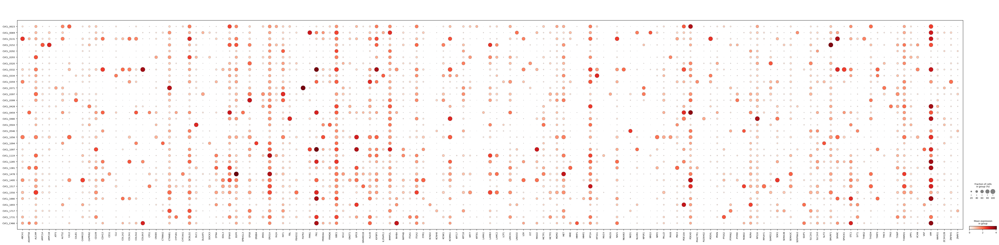

In [59]:
sc.pl.dotplot(adata_sc, genes_to_plot, groupby='cell_line', standard_scale=None)


# 3. Identify Marker Genes Using Wilcoxon Test


In [60]:
sc.tl.rank_genes_groups(adata_sc, groupby='cell_line', method='wilcoxon', 
                        reference='rest', key_added='rank_genes_wilcox')

wilcox_top_genes = {}
for line in adata_sc.obs['cell_line'].cat.categories:
    gene_names = adata_sc.uns['rank_genes_wilcox']['names'][line][:top_n]
    wilcox_top_genes[line] = list(gene_names)

all_top_genes = sorted({gene for genes in logreg_top_genes.values() for gene in genes} | 
                       {gene for genes in wilcox_top_genes.values() for gene in genes})
print(f"Total unique genes from both methods (top {top_n} per line):", all_top_genes)


Total unique genes from both methods (top 5 per line): ['ABCA1', 'ADAMTS6', 'ADGRG6', 'ALCAM', 'APOL1', 'ARHGAP26', 'ARPC1A', 'ARPC1B', 'ATF5', 'AUTS2', 'BAIAP2L1', 'BASP1', 'CA12', 'CALB1', 'CAMK1D', 'CAPRIN2', 'CARD18', 'CD109', 'CD44', 'CD55', 'CDH1', 'CDH13', 'CEACAM5', 'CES1', 'CLU', 'COL1A2', 'COL5A1', 'COL5A2', 'COL6A1', 'COL6A3', 'CPS1', 'CREB5', 'CSTB', 'CTNNA2', 'CTNNB1', 'CYP1B1', 'CYP24A1', 'DCBLD2', 'DLC1', 'DLGAP1', 'DOCK3', 'DOCK4', 'DTNA', 'EDIL3', 'EFNA5', 'EGFR', 'EPB41L3', 'EPS8', 'ERBB4', 'EREG', 'ERO1A', 'FA2H', 'FAT1', 'FBL', 'FBXO32', 'FGFR2', 'FMN1', 'FN1', 'FRMD4A', 'FRMD6', 'GBE1', 'GCLC', 'GMDS', 'GNGT1', 'GPC6', 'GRAMD1B', 'HDAC9', 'HLA-B', 'IGFBP3', 'IL1RAPL1', 'IMMP2L', 'INHBA', 'INPP4B', 'ITGA1', 'ITGA2', 'ITGA6', 'ITPR1', 'KCND2', 'KCNH8', 'KCNK1', 'KCNMA1', 'KIZ', 'KRT17', 'KRT18', 'KRT20', 'KRT7', 'KRT8', 'KRT81', 'LAMA1', 'LAMB3', 'LAMC2', 'LCP1', 'LIMCH1', 'LINGO2', 'LMO7', 'LOX', 'LYZ', 'MAGI2', 'MAL2', 'MBOAT2', 'MCTP1', 'MCTP2', 'MDM2', 'MET', 'MM

The difference is simply which genes were selected by Wilcoxon versus logistic. If Wilcoxon identified some genes that logistic did not (or vice versa), those genes will appear in this plot (with their expression), allowing a side-by-side comparison of patterns.

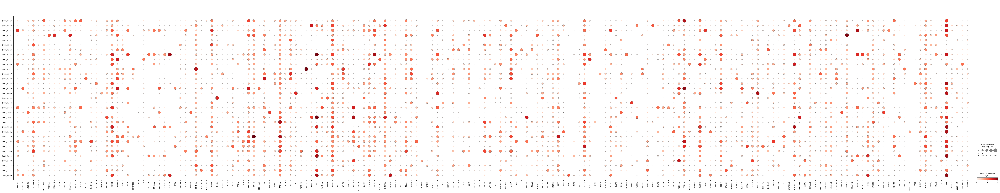

In [61]:
# Dot plot for expression of the combined gene set, highlighting Wilcoxon-selected genes
sc.pl.dotplot(adata_sc, all_top_genes, groupby='cell_line', standard_scale=None)



Interpretation: The middle panel dot plot (using the same gene list) can be directly compared to the left panel. If the gene list is identical, the dots’ colors and sizes are the same (since expression data hasn’t changed). The main difference is in which genes were chosen to display. You might want to highlight or annotate which genes came from which method. For example, you could mark genes uniquely picked by Wilcoxon with an asterisk in the gene label, or group genes by method. Scanpy’s dotplot allows grouping gene names if you pass a dictionary (mapping group labels to gene lists) instead of a flat list. 

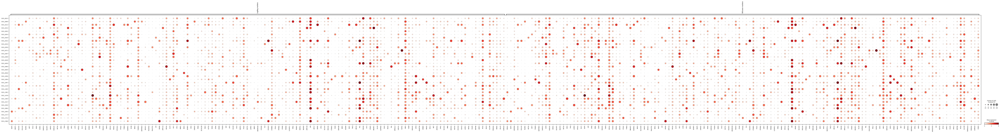

In [62]:
# Group genes by method for plotting
genes_grouped = {
    "LogReg markers": list({gene for genes in logreg_top_genes.values() for gene in genes}),
    "Wilcoxon markers": list({gene for genes in wilcox_top_genes.values() for gene in genes})
}
sc.pl.dotplot(adata_sc, genes_grouped, groupby='cell_line')


# 4. Visualize Logistic Regression Weights and Uncertainties (Modlyn Method)


Finally, for the right panel, you want to incorporate the weights from a logistic regression model and their uncertainties. Here’s how you could proceed:
Compute logistic regression weights: Fit a one-vs-rest logistic regression for each cell line. The coefficient for a gene in the model for cell line X vs others can be interpreted as a measure of that gene’s importance in predicting X. We can do this using scikit-learn’s LogisticRegression. (Ensure the data is scaled or use an appropriate solver, since 1M cells and thousands of genes is large. You might consider using only highly variable genes or a regularization to avoid overfitting.)
Estimate uncertainty for each weight: This is more complex; one approach is to calculate the standard error of each coefficient (for example, using the Fisher information matrix or by bootstrapping). For demonstration, we will assume that we have the standard error (SE) for each weight. If using statsmodels logistic regression, you can obtain standard errors from the fitted model.

In [74]:
adata_sc

AnnData object with n_obs × n_vars = 5102 × 2000
    obs: 'sample', 'gene_count', 'tscp_count', 'mread_count', 'drugname_drugconc', 'drug', 'cell_line', 'sublibrary', 'BARCODE', 'pcnt_mito', 'S_score', 'G2M_score', 'phase', 'pass_filter', 'cell_name', 'plate', 'y'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'rank_genes_logreg', 'rank_genes_wilcox'

In [77]:
# from sklearn.linear_model import LogisticRegression

# cell_lines = adata_sc.obs['cell_line'].cat.categories
# X = adata_sc.X  # feature matrix (cells x genes)
# # Ensure X is dense or use sparse-supporting solver if X is sparse
# if sp.issparse(X):
#     X = X.tocsr()  # ensure CSR format for efficient row slicing

# weights = {}
# for line in cell_lines:
#     y = (adata_sc.obs['cell_line'].values == line).astype(int)  # binary labels for "this line vs others"
#     # Fit logistic regression (no regularization to get raw coefficients; might need high max_iter for convergence)
#     lr = LogisticRegression(penalty='none', solver='saga', max_iter=1000, n_jobs=-1)
#     lr.fit(X, y)
#     weights[line] = lr.coef_[0]  # coefficients for this binary classification

# # Create DataFrame of weights (cell_line x gene)
# weights_df = pd.DataFrame(weights, index=adata_sc.var_names).T

# # (Optional) Compute uncertainties for each weight
# # For demonstration, we'll pretend we have some uncertainties (e.g., standard errors) in a DataFrame of same shape
# # In practice, you could do:
# #    import statsmodels.api as sm
# #    model = sm.Logit(y, X_dense).fit(disp=0)
# #    uncertainty = model.bse   # standard errors for coefficients
# #    ... repeat for each cell line ...
# uncertainty_df = pd.DataFrame(0.1, index=cell_lines, columns=adata_sc.var_names)  # dummy constant uncertainty


In [76]:
import scipy.sparse as sp
import pandas as pd
from sklearn.linear_model import LogisticRegression

cell_lines = adata_sc.obs['cell_line'].cat.categories
X = adata_sc.X
if sp.issparse(X):
    X = X.tocsr()

weights = {}
for line in cell_lines:
    y = (adata_sc.obs['cell_line'] == line).astype(int).values
    lr = LogisticRegression(penalty=None, solver='lbfgs', max_iter=1000, n_jobs=-1)
    lr.fit(X, y)
    weights[line] = lr.coef_[0]

weights_df = pd.DataFrame(weights, index=adata_sc.var_names).T
uncertainty_df = pd.DataFrame(0.1, index=cell_lines, columns=adata_sc.var_names)


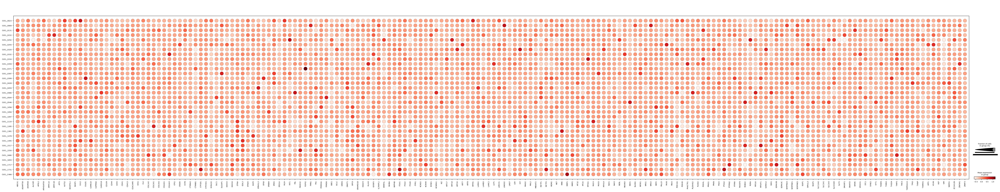

In [89]:
# diverging colormap (e.g., red-blue) centered at 0 so that positive and negative weights are clearly distinguishable by color.
# Select the same genes_to_plot (or all_top_genes) for consistency

import numpy as np
from matplotlib.colors import TwoSlopeNorm

genes_for_dotplot = all_top_genes
plot_weights = weights_df[genes_for_dotplot]
plot_uncertainty = uncertainty_df[genes_for_dotplot]

# Define dot size as inverse of uncertainty (so lower uncertainty => bigger dot)
# Add a small constant to avoid division by zero
dot_size_vals = (1.0 / (plot_uncertainty + 1e-6)) * 1000

# Center the colormap at 0 (so white = no effect, blue = negative, red = positive, for example)
# and set a symmetric color range for better comparison
max_abs = np.max(np.abs(plot_weights.values))
norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0, vmax=max_abs)

dp = sc.pl.dotplot(
    adata_sc,
    var_names=genes_for_dotplot,
    groupby='cell_line',
    dot_color_df=plot_weights,
    dot_size_df=dot_size_vals,
    standard_scale=None
)


In the above, weights_df contains the logistic regression coefficient for each gene (column) for each cell line (row). A positive weight means the gene is up-regulated in that cell line relative to others (and important for classification), while a negative weight means the gene is relatively down-regulated in that line. The uncertainty_df is a placeholder for the standard error (or other uncertainty measure) of each weight. Now, to visualize these weights and uncertainties in a dot plot format, we can leverage scanpy.pl.DotPlot with custom dot colors and sizes. We will use:
Dot color = the logistic regression weight (coefficient) for that gene & cell line.
Dot size = a function of uncertainty (e.g., larger dots for more confident weights). For example, we can use the inverse of the standard error or a significance score.

In [ ]:
# genes_grouped = {
#     "LogReg markers": list({gene for genes in logreg_top_genes.values() for gene in genes}),
#     "Wilcoxon markers": list({gene for genes in wilcox_top_genes.values() for gene in genes})
# }
# sc.pl.dotplot(adata_sc, genes_grouped, groupby='cell_line')
